In [1]:
from zs6d import ZS6D
import os
import json


# Loading the config file:
with open(os.path.join("./zs6d_configs/bop_eval_configs/cfg_ycbv_inference_bop.json"), "r") as f:
    config = json.load(f)
    
# Instantiating the pose estimator:
# This involves handing over the path to the templates_gt file and the corresponding object norm_factors.
pose_estimator = ZS6D(config['templates_gt_path'], config['norm_factor_path'])

Using cache found in C:\Users\nidul/.cache\torch\hub\facebookresearch_dino_main
100%|██████████| 21/21 [04:54<00:00, 14.01s/it]


{'000056_1': [{'scene_id': '000056', 'obj_id': 1, 'bbox_obj': [138, 165, 134, 211], 'bbox_visib': [138, 165, 134, 211], 'img_name': './test/000056/rgb/000001.png', 'cam_R_m2c': [0.25344259862252894, 0.967062444907854, 0.023598126881120306, 0.3379252561470427, -0.06565103180890929, -0.9388805087260805, -0.9064072681266561, 0.24592676377433598, -0.34343354111832913], 'cam_t_m2c': [-83.37310979913636, 21.041325702374337, 837.3672823741553], 'px_count_all': 25994, 'px_count_valid': 19961, 'px_count_visib': 22319, 'visib_fract': 0.8586212202816035, 'cam_K': [1066.778, 0.0, 312.9869, 0.0, 1067.487, 241.3109, 0.0, 0.0, 1.0], 'depth_scale': 0.1, 'model_path': './models/obj_000001.ply', 'model_info': {'diameter': 172.063, 'min_x': -51.1445, 'min_y': -51.223, 'min_z': -70.072, 'size_x': 102.289, 'size_y': 102.446, 'size_z': 140.144, 'symmetries_discrete': [[-1, -4.31991e-14, 0, 0, 4.31991e-14, -1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]}, 'sam_score': 0.7587944865226746, 'mask_sam': {'counts': [64985, 6,

[running kmeans]: 1it [00:00, 116.18it/s, center_shift=0.000000, iteration=1, tol=0.000100]


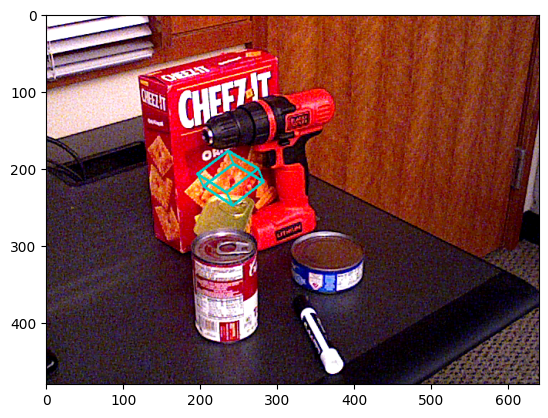

Pose estimation time: 1.9877300262451172
R_est: [[-0.29182984  0.73923835 -0.60692834]
 [-0.72210602 -0.58639579 -0.3670189 ]
 [-0.62721467  0.33115954  0.70493625]]
t_est: [-229.70372857  -89.93621355 3324.55798056]
running k-means on cuda..


[running kmeans]: 10it [00:00, 15.95it/s, center_shift=0.000000, iteration=10, tol=0.000100]


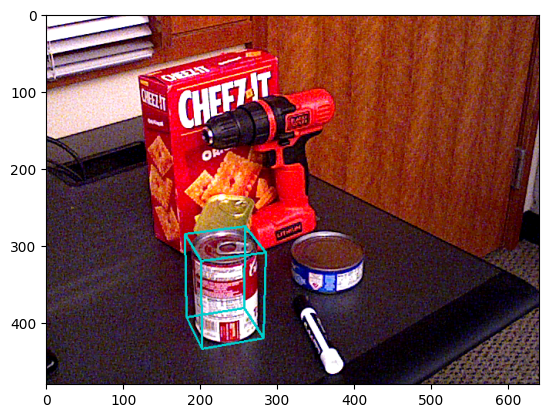

Pose estimation time: 2.234881639480591
R_est: [[ 0.35016772  0.93620449  0.03006197]
 [ 0.35977819 -0.1047968  -0.92713391]
 [-0.86483653  0.33546801 -0.37352241]]
t_est: [-67.12571987  92.14199441 878.94083304]
running k-means on cuda..


[running kmeans]: 4it [00:00, 17.37it/s, center_shift=0.000000, iteration=4, tol=0.000100]


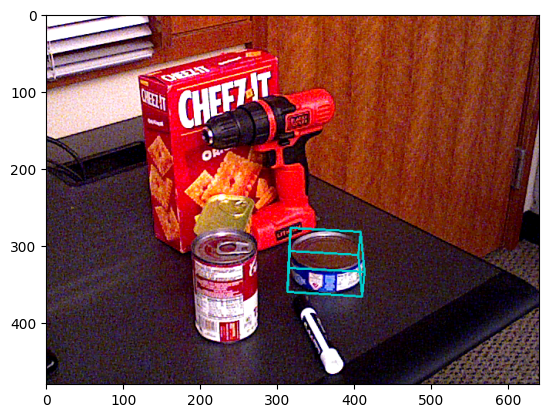

Pose estimation time: 5.502531290054321
R_est: [[ 2.68490476e-02 -9.98486290e-01  4.80026709e-02]
 [-4.93622654e-01 -5.49997648e-02 -8.67935309e-01]
 [ 8.69261643e-01 -3.91969387e-04 -4.94352144e-01]]
t_est: [ 45.20122632  72.07427355 970.90542508]
running k-means on cuda..


[running kmeans]: 2it [00:00, 66.37it/s, center_shift=0.000000, iteration=2, tol=0.000100]


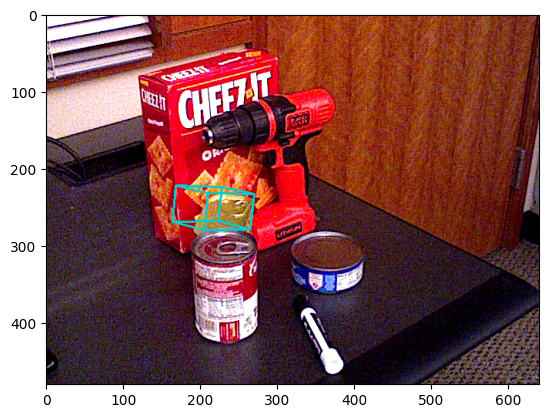

Pose estimation time: 6.469104290008545
R_est: [[ 0.69750615  0.11701938  0.70695943]
 [ 0.0098811  -0.98805285  0.15379837]
 [ 0.71651067 -0.10028977 -0.69032921]]
t_est: [-124.09390656   13.0609858  1385.42587796]
running k-means on cuda..


[running kmeans]: 1it [00:00, 112.22it/s, center_shift=0.000000, iteration=1, tol=0.000100]


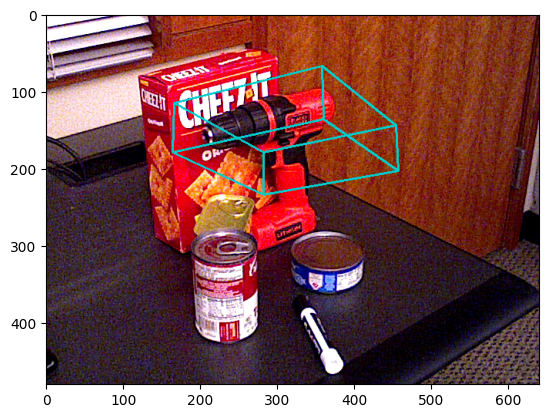

Pose estimation time: 1.4524667263031006
R_est: [[-0.8656319  -0.50062517 -0.00747335]
 [ 0.14662169 -0.23919534 -0.95983731]
 [ 0.47873113 -0.83196155  0.28045763]]
t_est: [  2.54862818 -70.1771752  932.32616291]
running k-means on cuda..


[running kmeans]: 3it [00:00, 40.06it/s, center_shift=0.000000, iteration=3, tol=0.000100]


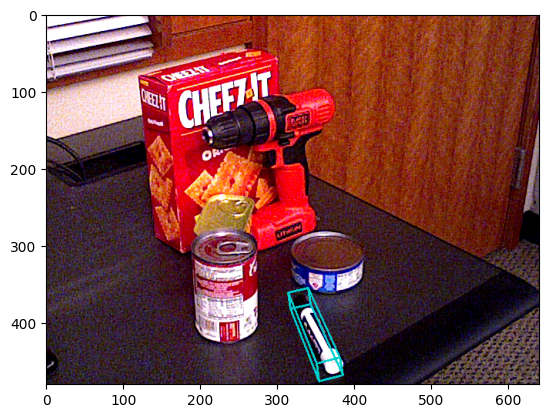

Pose estimation time: 1.6154444217681885
R_est: [[-0.96885367 -0.20351129  0.14108766]
 [ 0.21408687 -0.4020187   0.89025152]
 [-0.12445636  0.89272847  0.43306639]]
t_est: [ 24.65865059 122.2671649  765.57162072]


In [7]:
import cv2
from PIL import Image
import pose_utils.img_utils as img_utils
import pose_utils.vis_utils as vis_utils
import numpy as np
import time
import matplotlib.pyplot as plt

# Loading a ground truth file to access segmentation masks to test zs6d:
with open(os.path.join(config['gt_path']), 'r') as f:
    data_gt = json.load(f)

print(data_gt)
img_id = '000059_1'
# img_id = '8'



for i in range(len(data_gt[img_id])):
    obj_number = i
    obj_id = data_gt[img_id][obj_number]['obj_id']
    cam_K = np.array(data_gt[img_id][obj_number]['cam_K']).reshape((3,3))
    bbox = data_gt[img_id][obj_number]['bbox_visib']

    img_path = os.path.join(config['dataset_path'], data_gt[img_id][obj_number]['img_name'].split("./")[-1])
    img = Image.open(img_path)

    mask = data_gt[img_id][obj_number]['mask_sam']
    mask = img_utils.rle_to_mask(mask)
    mask = mask.astype(np.uint8)

    start_time = time.time()
    
    # To estimate the objects Rotation R and translation t the input image, the object_id, a segmentation mask and camera matrix are necessary
    R_est, t_est = pose_estimator.get_pose(img, str(obj_id), mask, cam_K, bbox=None)

    end_time = time.time()
    
    out_img = vis_utils.draw_3D_bbox_on_image(np.array(img), R_est, t_est, cam_K, data_gt[img_id][obj_number]['model_info'], factor=1.0)

    plt.imshow(out_img)
    plt.show()
    print(f"Pose estimation time: {end_time-start_time}")
    print(f"R_est: {R_est}")
    print(f"t_est: {t_est}")




running k-means on cuda..


[running kmeans]: 4it [00:00, 31.47it/s, center_shift=0.000000, iteration=4, tol=0.000100]


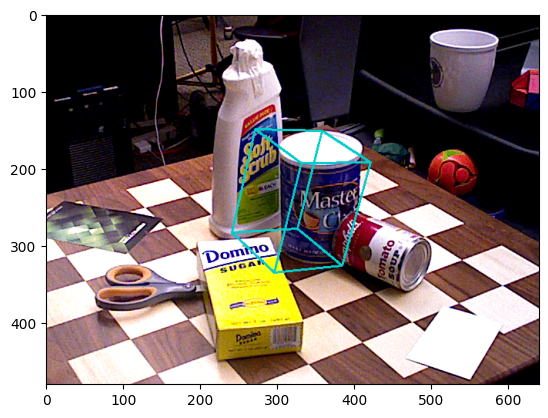

Pose estimation time: 2.059868574142456
R_est: [[-0.53638511 -0.81432545  0.22173202]
 [-0.42630456  0.03467478 -0.90391486]
 [ 0.72839237 -0.57937184 -0.36574969]]
t_est: [  14.81126295   -1.65441361 1008.84292163]
running k-means on cuda..


[running kmeans]: 4it [00:00,  5.97it/s, center_shift=0.000000, iteration=4, tol=0.000100] 


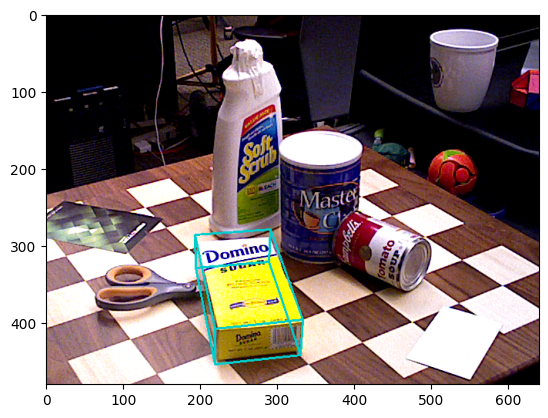

Pose estimation time: 5.768491268157959
R_est: [[ 0.05171505  0.97600051 -0.21153856]
 [-0.85257774 -0.06715418 -0.5182678 ]
 [-0.52003533  0.20715531  0.82864343]]
t_est: [-48.79798913 106.15570371 952.17270893]
running k-means on cuda..


[running kmeans]: 1it [00:00, 333.49it/s, center_shift=0.000000, iteration=1, tol=0.000100]


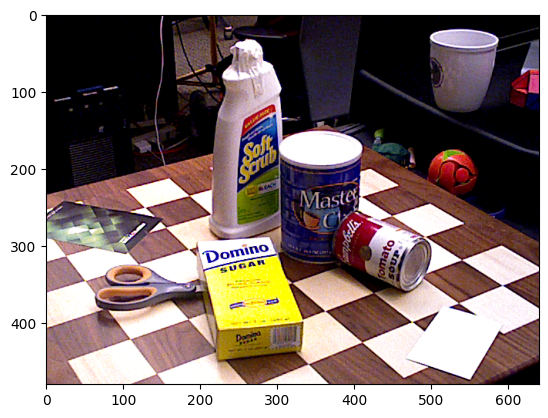

Pose estimation time: 1.6220297813415527
R_est: [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
t_est: [0. 0. 0.]
running k-means on cuda..


[running kmeans]: 7it [00:00, 31.77it/s, center_shift=0.000000, iteration=7, tol=0.000100]


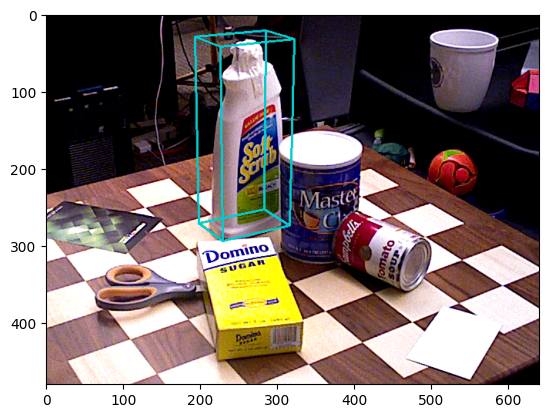

Pose estimation time: 1.9493818283081055
R_est: [[ 0.84648755 -0.5320417   0.01976   ]
 [-0.17906515 -0.31945553 -0.93052879]
 [ 0.50139256  0.78414271 -0.36568526]]
t_est: [ -54.99610089  -83.47929624 1063.5608678 ]
running k-means on cuda..


[running kmeans]: 2it [00:00, 53.42it/s, center_shift=0.000000, iteration=2, tol=0.000100]


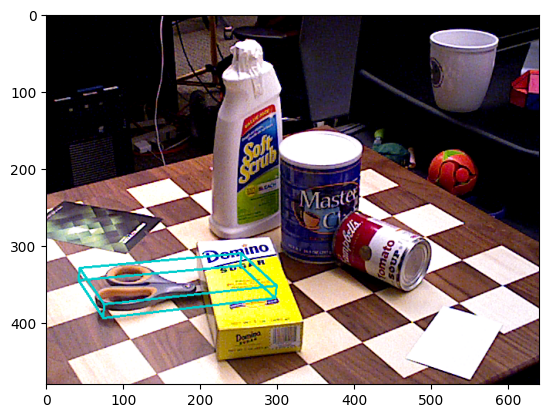

Pose estimation time: 6.931002855300903
R_est: [[ 0.46861636  0.87562051  0.11699334]
 [ 0.32351692 -0.04686904 -0.9450609 ]
 [-0.82203133  0.48072032 -0.30524164]]
t_est: [-123.19069413   94.08569055  933.20830958]


In [8]:
img_id = '000051_1'
# img_id = '8'



for i in range(len(data_gt[img_id])):
    obj_number = i
    obj_id = data_gt[img_id][obj_number]['obj_id']
    cam_K = np.array(data_gt[img_id][obj_number]['cam_K']).reshape((3,3))
    bbox = data_gt[img_id][obj_number]['bbox_visib']

    img_path = os.path.join(config['dataset_path'], data_gt[img_id][obj_number]['img_name'].split("./")[-1])
    img = Image.open(img_path)

    mask = data_gt[img_id][obj_number]['mask_sam']
    mask = img_utils.rle_to_mask(mask)
    mask = mask.astype(np.uint8)

    start_time = time.time()
    
    # To estimate the objects Rotation R and translation t the input image, the object_id, a segmentation mask and camera matrix are necessary
    R_est, t_est = pose_estimator.get_pose(img, str(obj_id), mask, cam_K, bbox=None)

    end_time = time.time()
    
    out_img = vis_utils.draw_3D_bbox_on_image(np.array(img), R_est, t_est, cam_K, data_gt[img_id][obj_number]['model_info'], factor=1.0)

    plt.imshow(out_img)
    plt.show()
    print(f"Pose estimation time: {end_time-start_time}")
    print(f"R_est: {R_est}")
    print(f"t_est: {t_est}")

running k-means on cuda..


[running kmeans]: 4it [00:00, 20.34it/s, center_shift=0.000000, iteration=4, tol=0.000100]


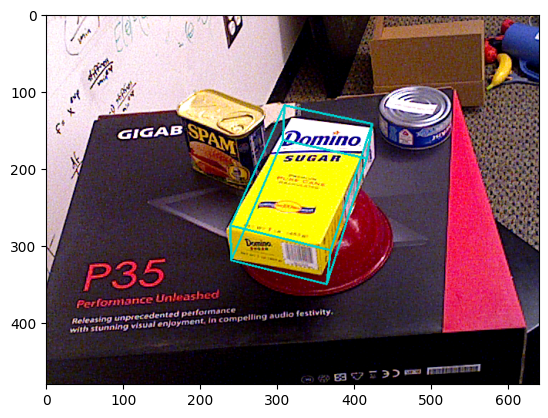

Pose estimation time: 2.186368465423584
R_est: [[ 0.03575467  0.96061574  0.27557032]
 [-0.68206685  0.224995   -0.69581755]
 [-0.73041524 -0.16307865  0.66324877]]
t_est: [ 17.08639133 -10.45015097 813.20567263]
running k-means on cuda..


[running kmeans]: 5it [00:00, 40.56it/s, center_shift=0.000000, iteration=5, tol=0.000100]


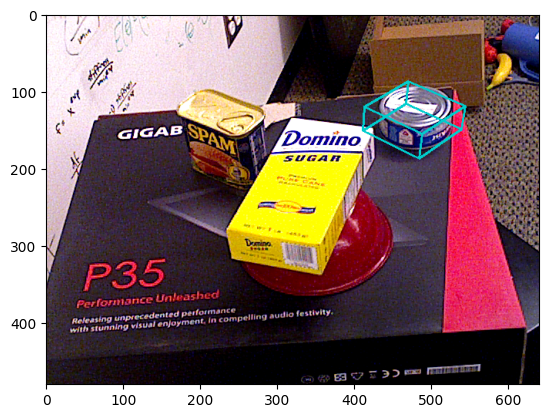

Pose estimation time: 2.443432569503784
R_est: [[-0.69839562  0.71568739 -0.00592659]
 [ 0.44211528  0.42489186 -0.78993733]
 [-0.56283003 -0.55430901 -0.61315894]]
t_est: [152.8377814  -98.65276587 993.71591134]
running k-means on cuda..


[running kmeans]: 6it [00:00, 27.48it/s, center_shift=0.000000, iteration=6, tol=0.000100]


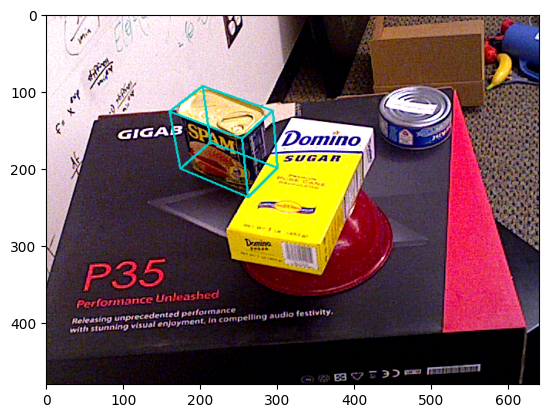

Pose estimation time: 1.7983369827270508
R_est: [[-0.82984761 -0.55540121 -0.05368836]
 [-0.33340418  0.5706941  -0.75043314]
 [ 0.4474311  -0.60484523 -0.65876222]]
t_est: [-72.55463238 -69.38164708 961.64732359]
running k-means on cuda..


[running kmeans]: 1it [00:00, 110.10it/s, center_shift=0.000000, iteration=1, tol=0.000100]


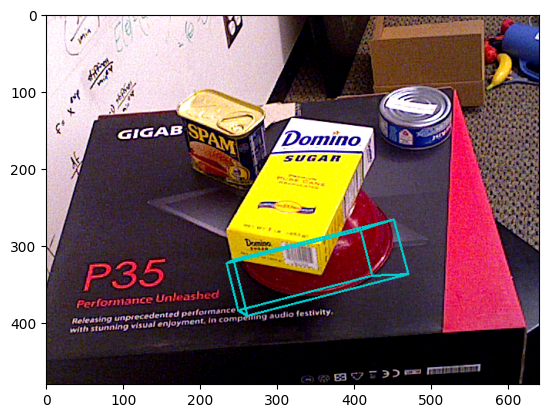

Pose estimation time: 7.1814680099487305
R_est: [[ 0.96300307 -0.11387571 -0.24424866]
 [-0.23346379  0.10018515 -0.96719057]
 [ 0.1346096   0.98843071  0.06989275]]
t_est: [ 24.42332044  72.59386335 871.85463321]


In [10]:
img_id = '000049_1'
# img_id = '8'



for i in range(len(data_gt[img_id])):
    obj_number = i
    obj_id = data_gt[img_id][obj_number]['obj_id']
    cam_K = np.array(data_gt[img_id][obj_number]['cam_K']).reshape((3,3))
    bbox = data_gt[img_id][obj_number]['bbox_visib']

    img_path = os.path.join(config['dataset_path'], data_gt[img_id][obj_number]['img_name'].split("./")[-1])
    img = Image.open(img_path)

    mask = data_gt[img_id][obj_number]['mask_sam']
    mask = img_utils.rle_to_mask(mask)
    mask = mask.astype(np.uint8)

    start_time = time.time()
    
    # To estimate the objects Rotation R and translation t the input image, the object_id, a segmentation mask and camera matrix are necessary
    R_est, t_est = pose_estimator.get_pose(img, str(obj_id), mask, cam_K, bbox=None)

    end_time = time.time()
    
    out_img = vis_utils.draw_3D_bbox_on_image(np.array(img), R_est, t_est, cam_K, data_gt[img_id][obj_number]['model_info'], factor=1.0)

    plt.imshow(out_img)
    plt.show()
    print(f"Pose estimation time: {end_time-start_time}")
    print(f"R_est: {R_est}")
    print(f"t_est: {t_est}")